In [3]:
pip install opencv-python

   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.3/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.3/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.3/39.5 MB ? eta -:--:--
    --------------------------------------- 0.5/39.5 MB 453.5 kB/s eta 0:01:26
    --------------------------------------- 0.5/39.5 MB 453.5 kB/s eta 0:01:26
    --------------------------------------- 0.8/39.5 MB 508.0 kB/s eta 0:01:17
    --------------------------------------- 0.8/39.5 MB 508.0 kB/s eta 0:01:17
   - -------------------------------------- 1.0/39.5 M

In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [12]:
# Инициализация видеопотока с веб-камеры
cap = cv2.VideoCapture(0)

# Проверка, инициализирован ли видеопоток
if not cap.isOpened():
    print("Ошибка: не удалось открыть камеру!")
    exit()

# Получаем ширину и высоту видео
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Настройка записи видео (кодек, имя файла, FPS, размер)
fourcc = cv2.VideoWriter_fourcc(*'XVID')  # Можно использовать 'MJPG', 'XVID', 'mp4v'
out = cv2.VideoWriter('output.avi', fourcc, 20.0, (frame_width, frame_height))

# Загрузка каскада Хаара
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Конвертация в оттенки серого
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Детектирование лиц
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    # Рисуем прямоугольники вокруг лиц
    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 0), 2)

    # Запись кадра в видеофайл
    out.write(frame)

    # Показ окна
    cv2.imshow('Face Detection & Recording', frame)

    # Выход при нажатии 'q'
    if cv2.waitKey(1) & 0xFF == ord('q'):
        print("Завершение записи...")
        break

# Освобождение ресурсов
cap.release()
out.release()
cv2.destroyAllWindows()

Завершение записи...


<h1> OpenCV </h1>

OpenCV (Open Source Computer Vision Library) — это широко используемая библиотека с открытым исходным кодом, предназначенная для разработки приложений в области компьютерного зрения и обработки изображений.

<h2> Основные возможности OpenCV </h2>

Обработка изображений: включает фильтрацию, преобразование цветовых пространств, вычисление гистограмм.

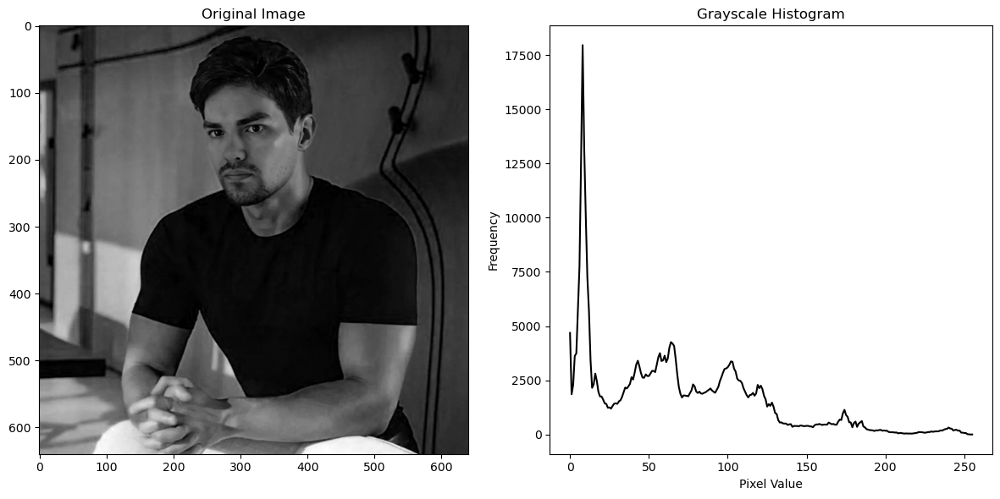

In [67]:
# Загрузка изображения
img = cv2.imread('C:\\Users\\user\\Downloads\\face.jpg')

# Вычисление гистограммы
hist = cv2.calcHist([img[:,:,0]], [0], None, [256], [0,256])

# Отображение изображения и его гистограммы
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img[:,:,0], cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.plot(hist, color='black')
plt.title('Grayscale Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

Обнаружение и сопоставление признаков: позволяет находить и сопоставлять ключевые точки на разных изображениях (например, для создания панорам или распознавания объектов).

In [12]:
img1 = cv2.imread('C:\\Users\\user\\Downloads\\face.jpg', 0)
img2 = cv2.imread('C:\\Users\\user\\Downloads\\face1.jpg', 0)

# Инициализация ORB
orb = cv2.ORB_create()

# Нахождение ключевых точек и дескрипторов
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Сопоставление признаков
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)

# Визуализация совпадений
result = cv2.drawMatches(img1, kp1, img2, kp2, matches[:10], None)

cv2.imshow('Matches', result)
cv2.waitKey(0)

-1

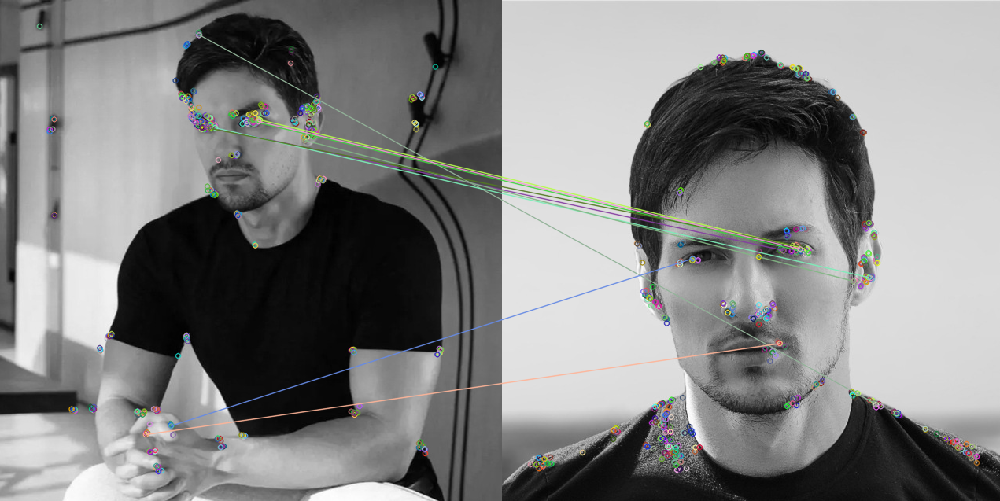

Обнаружение объектов: поддержка каскадных классификаторов Хаара и моделей на основе глубокого обучения, широко применяется для распознавания лиц.

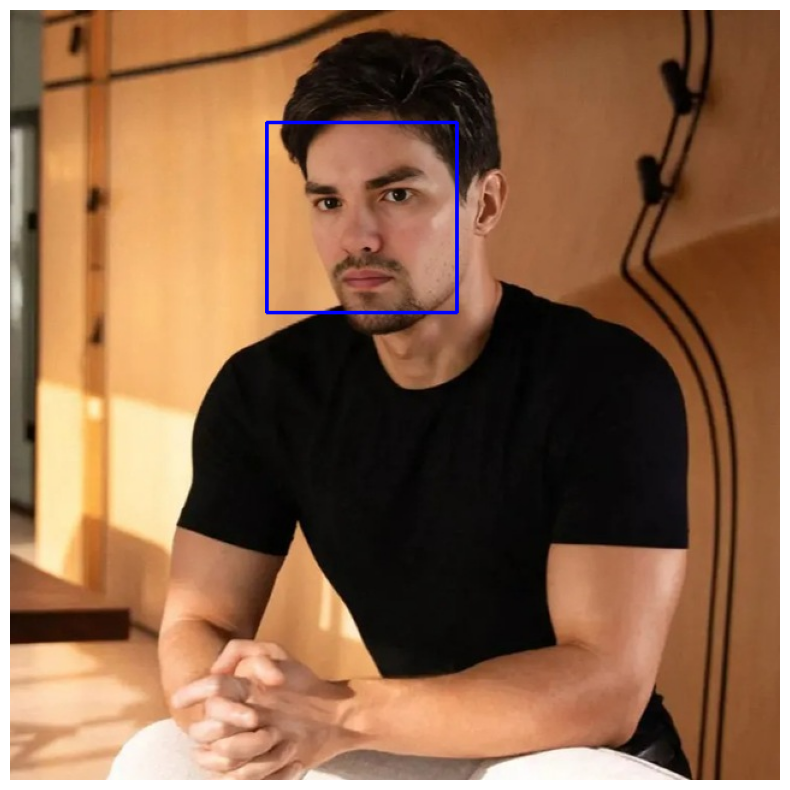

In [18]:
# Загрузка изображения
image = cv2.imread('C:\\Users\\user\\Downloads\\face.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Применение размытия
# image = cv2.GaussianBlur(image, (151, 151), 150)

# Загрузка предварительно обученного каскада Хаара для детектирования лиц
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Детектирование лиц на изображении
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

# Рисуем прямоугольники вокруг обнаруженных лиц
for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x+w, y+h), (255, 0, 0), 2)

# Отображение результата с помощью matplotlib
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')  # Отключаем оси координат
plt.show()

Геометрия изображений: калибровка камеры, 3D-реконструкция.

In [20]:
# Подготовка данных
pattern_size = (9,6)
objp = np.zeros((pattern_size[0]*pattern_size[1],3), np.float32)
objp[:,:2] = np.mgrid[0:pattern_size[0],0:pattern_size[1]].T.reshape(-1,2)

# Поиск углов шахматной доски
ret, corners = cv2.findChessboardCorners(gray, pattern_size, None)

if ret:
    cv2.drawChessboardCorners(img, pattern_size, corners, ret)
    cv2.imshow('Corners', img)
    cv2.waitKey(0)

Машинное обучение: интегрированные алгоритмы, такие как k-ближайших соседей (k-NN) и опорные векторы (SVM), для задач, связанных с компьютерным зрением.

In [25]:
# Создание синтетических данных
data = np.random.randint(0,100,(25,2)).astype(np.float32)
labels = np.random.randint(0,2,(25,1)).astype(np.float32)

# Обучение модели
knn = cv2.ml.KNearest_create()
knn.train(data, cv2.ml.ROW_SAMPLE, labels)

# Предсказание
new_comer = np.array([[50,50]], dtype=np.float32)
ret, results = knn.predict(new_comer)
print(f"Predicted class: {results[0][0]}")

Predicted class: 1.0


Анализ видео: анализ движения, выделение фона и другие техники.

In [30]:
cap = cv2.VideoCapture('C:\\Users\\user\\Downloads\\1609002763_looped_1609002761.mp4')
fgbg = cv2.createBackgroundSubtractorMOG2()

while True:
    ret, frame = cap.read()
    if not ret:
        break
    
    fgmask = fgbg.apply(frame)
    
    cv2.imshow('Foreground', fgmask)
    if cv2.waitKey(30) == 27:
        break

cap.release()
cv2.destroyAllWindows()

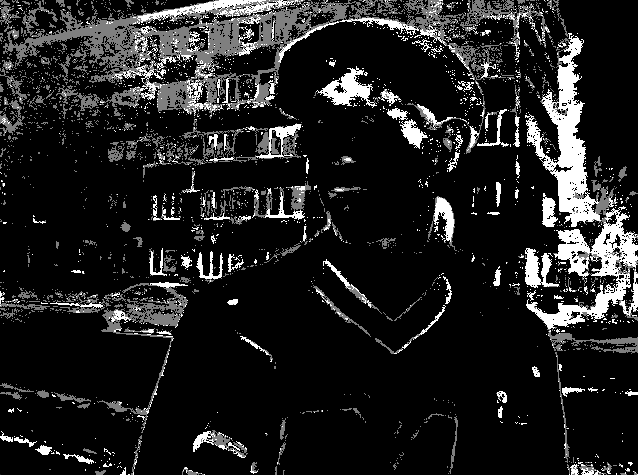

Инструменты GUI: создание интерактивных интерфейсов.

Интеграция: совместимость с библиотеками NumPy, TensorFlow и другими

In [38]:
import tensorflow as tf

# Загрузка модели TF
model = tf.keras.applications.MobileNetV2()

# Преобразование изображения для нейросети
blob = cv2.dnn.blobFromImage(img, 1.0, (224,224), (127.5,127.5,127.5), swapRB=True)
model.predict(blob.transpose(0,2,3,1))  # Пример использования

# Совместимость с numpy
arr = np.array(img)  # Конвертация OpenCV image -> numpy array
cv_image = cv2.cvtColor(arr, cv2.COLOR_RGB2BGR)  # Обратная конвертация

14536120/14536120 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 824ms/step


<h2> Фильтры и методы фильтрации в OpenCV</h2>

OpenCV использует множество типов фильтров для обработки изображений, которые можно условно разделить на несколько основных категорий:

<h3> Линейные свёрточные фильтры</h3>

1. Фильтр 2D (filter2D): универсальный фильтр, который применяет свёртку изображения с произвольным ядром (матрицей). Позволяет создавать собственные 2 фильтры, например, для повышения резкости или размытия.

2. Фильтр Собеля: выделяет градиенты и края на изображении, часто применяется для поиска контуров.

3. Средний фильтр (Averaging, BoxFilter): усредняет значения пикселей в окрестности, что приводит к размытию изображения и снижению шума.

4. Гауссов фильтр (GaussianBlur): применяет свёртку с ядром гауссового распределения, эффективно сглаживая изображение и уменьшая шум, при этом лучше сохраняет края по сравнению с простым усреднением.

In [59]:
# Загрузка изображения
img = cv2.imread('C:\\Users\\user\\Downloads\\face.jpg')
if img is None:
    print("Ошибка загрузки изображения!")
    exit()

# Создание кастомных ядер
kernel_blur = np.ones((5,5), np.float32) / 25  # Ядро для размытия
kernel_sharpen = np.array([[-1,-1,-1],         # Ядро для повышения резкости
                          [-1, 9,-1],
                          [-1,-1,-1]])
kernel_edge = np.array([[-1,-1,-1],            # Ядро для выделения границ
                       [-1, 8,-1],
                       [-1,-1,-1]])

# Применение фильтров
blurred = cv2.filter2D(img, -1, kernel_blur)
sharpened = cv2.filter2D(img, -1, kernel_sharpen)
edges = cv2.filter2D(img, -1, kernel_edge)

# Визуализация результатов
combined = np.hstack((img, blurred, sharpened, edges))
cv2.imshow('Original | Blurred | Sharpened | Edges', combined)
cv2.waitKey(0)
cv2.destroyAllWindows()

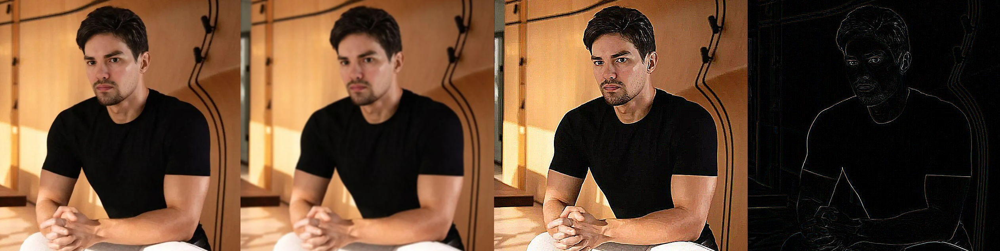

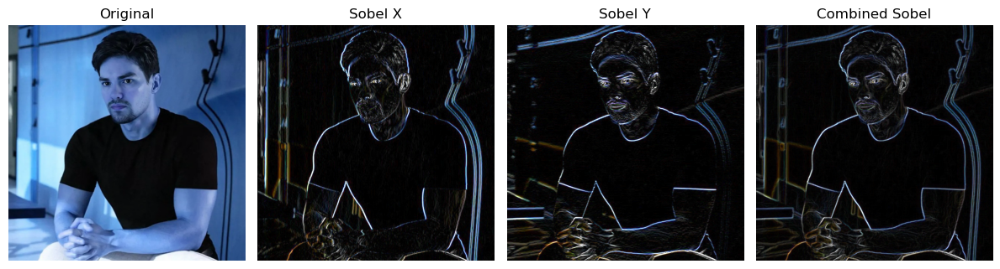

In [76]:
# Применение фильтра Собеля
sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)  # Горизонтальные границы
sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)  # Вертикальные границы

# Конвертация в 8-битный формат
sobel_x_abs = cv2.convertScaleAbs(sobel_x)
sobel_y_abs = cv2.convertScaleAbs(sobel_y)

# src, Исходное изображение (обязательно одноканальное!)
# ddepth,Глубина выходного изображения (cv2.CV_64F для сохранения отрицательных значений)
# dx, Порядок производной по X (0 или 1)
# dy, Порядок производной по Y (0 или 1)
# ksize=3, Размер ядра (1, 3, 5 или 7)
# scale=1, Масштабный коэффициент
# delta=0, Смещение значений
# borderType=cv2.BORDER_DEFAULT Тип границ)'

# Комбинирование результатов
sobel_combined = cv2.addWeighted(sobel_x_abs, 0.5, sobel_y_abs, 0.5, 0)

# Отображение с Matplotlib
plt.figure(figsize=(12, 6))

plt.subplot(141), plt.imshow(img, cmap='gray')
plt.title('Original'), plt.axis('off')

plt.subplot(142), plt.imshow(sobel_x_abs, cmap='gray')
plt.title('Sobel X'), plt.axis('off')

plt.subplot(143), plt.imshow(sobel_y_abs, cmap='gray')
plt.title('Sobel Y'), plt.axis('off')

plt.subplot(144), plt.imshow(sobel_combined, cmap='gray')
plt.title('Combined Sobel'), plt.axis('off')

plt.tight_layout()
plt.show()

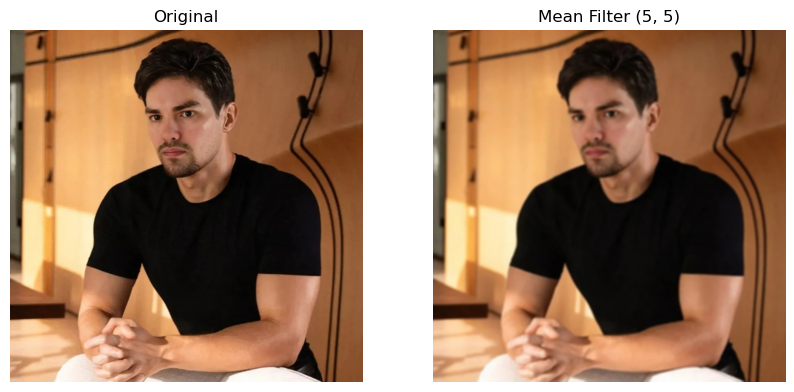

In [84]:
# Применение среднего фильтра с ядром 5x5
kernel_size = (5, 5)
blurred = cv2.blur(img, kernel_size)

# Конвертация BGR -> RGB для Matplotlib
img_rgb = cv2.cvtColor(img, cv2.BORDER_DEFAULT)
blurred_rgb = cv2.cvtColor(blurred, cv2.BORDER_DEFAULT)

# Отображение результатов
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(img_rgb), plt.title('Original'), plt.axis('off')
plt.subplot(122), plt.imshow(blurred_rgb), plt.title(f'Mean Filter {kernel_size}'), plt.axis('off')
plt.show()

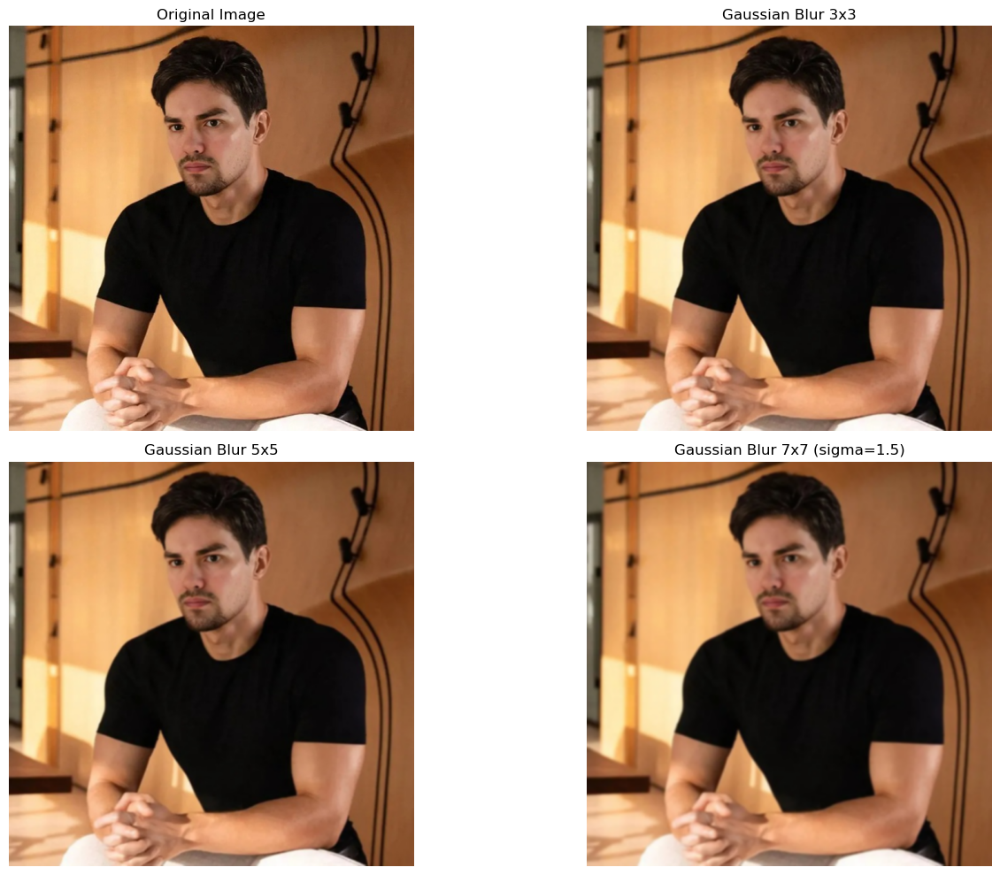

In [82]:
# Применение Гауссова фильтра с разными параметрами
blur_3x3 = cv2.GaussianBlur(img, (3,3), 0)    # Ядро 3x3, sigma вычисляется автоматически
blur_5x5 = cv2.GaussianBlur(img, (5,5), 0)    # Ядро 5x5
blur_7x7 = cv2.GaussianBlur(img, (7,7), 1.5)  # Ядро 7x7 с sigma=1.5

# Конвертация BGR в RGB для Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
blur_3x3_rgb = cv2.cvtColor(blur_3x3, cv2.COLOR_BGR2RGB)
blur_5x5_rgb = cv2.cvtColor(blur_5x5, cv2.COLOR_BGR2RGB)
blur_7x7_rgb = cv2.cvtColor(blur_7x7, cv2.COLOR_BGR2RGB)

# Создание сетки для отображения
plt.figure(figsize=(15, 10))

plt.subplot(221), plt.imshow(img_rgb)
plt.title('Original Image'), plt.axis('off')

plt.subplot(222), plt.imshow(blur_3x3_rgb)
plt.title('Gaussian Blur 3x3'), plt.axis('off')

plt.subplot(223), plt.imshow(blur_5x5_rgb)
plt.title('Gaussian Blur 5x5'), plt.axis('off')

plt.subplot(224), plt.imshow(blur_7x7_rgb)
plt.title('Gaussian Blur 7x7 (sigma=1.5)'), plt.axis('off')

plt.tight_layout()
plt.show()

Особенности Гауссова фильтра:
1. Сохраняет границы лучше, чем средний фильтр

2. Веса ядра распределены по нормальному закону

3. Эффективен против гауссова шума

4. Часто используется как предобработка для других алгоритмов (например, детекторов границ)

<h3> Нелинейные фильтры</h3>

1. Медианный фильтр (medianBlur): заменяет значение пикселя медианой соседних значений, эффективно удаляет шум «соль-перец» без сильного размытия.

2. Двусторонний фильтр (bilateralFilter): уменьшает шум, сохраняя при этом резкие границы и детали, что важно для сохранения контуров объектов

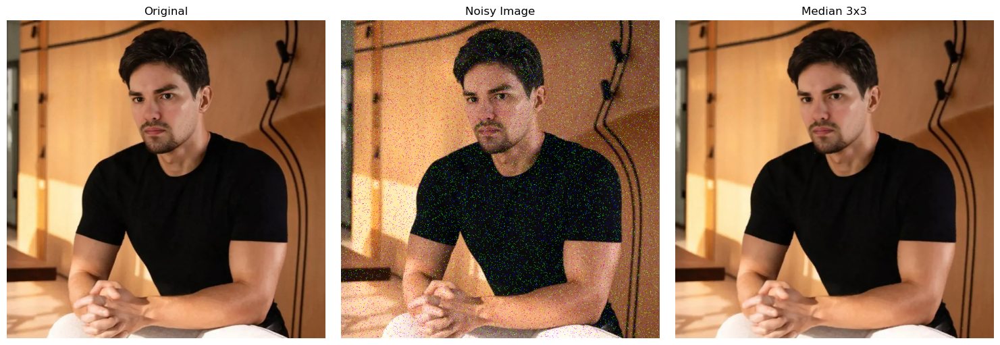

In [89]:
# Добавление "соляно-перцевого" шума
def add_salt_pepper_noise(image, prob=0.05):
    output = np.copy(image)
    salt = np.ceil(prob * image.size * 0.5)
    coords = [np.random.randint(0, i-1, int(salt)) for i in image.shape]
    output[tuple(coords)] = 255
    pepper = np.ceil(prob * image.size * 0.5)
    coords = [np.random.randint(0, i-1, int(pepper)) for i in image.shape]
    output[tuple(coords)] = 0
    return output

# Применение медианного фильтра с разными ядрами
noisy_img = add_salt_pepper_noise(img)
filtered_3 = cv2.medianBlur(noisy_img, 3)

# Конвертация BGR -> RGB для Matplotlib
images = {
    'Original': cv2.cvtColor(img, cv2.COLOR_BGR2RGB),
    'Noisy Image': cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB),
    'Median 3x3': cv2.cvtColor(filtered_3, cv2.COLOR_BGR2RGB)
}

# Отображение результатов
plt.figure(figsize=(15, 10))

for i, (title, image) in enumerate(images.items(), 1):
    plt.subplot(2, 3, i)
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

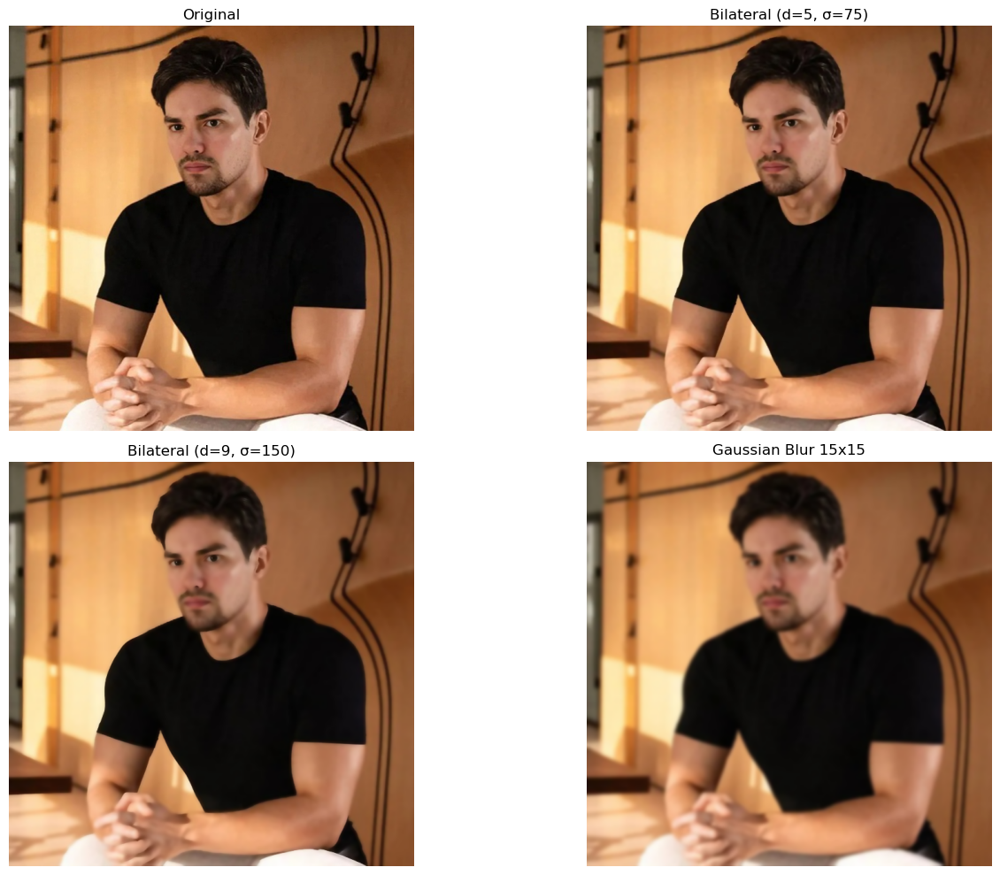

In [91]:
# Применение двустороннего фильтра
filtered_5 = cv2.bilateralFilter(img, d=5, sigmaColor=75, sigmaSpace=75)
filtered_9 = cv2.bilateralFilter(img, d=9, sigmaColor=150, sigmaSpace=150)

# Сравнение с Гауссовым фильтром
gaussian_blur = cv2.GaussianBlur(img, (15,15), 0)

# Конвертация BGR -> RGB для Matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
filtered_5_rgb = cv2.cvtColor(filtered_5, cv2.COLOR_BGR2RGB)
filtered_9_rgb = cv2.cvtColor(filtered_9, cv2.COLOR_BGR2RGB)
gaussian_rgb = cv2.cvtColor(gaussian_blur, cv2.COLOR_BGR2RGB)

# Визуализация
plt.figure(figsize=(15, 10))

plt.subplot(221), plt.imshow(img_rgb)
plt.title('Original'), plt.axis('off')

plt.subplot(222), plt.imshow(filtered_5_rgb)
plt.title('Bilateral (d=5, σ=75)'), plt.axis('off')

plt.subplot(223), plt.imshow(filtered_9_rgb)
plt.title('Bilateral (d=9, σ=150)'), plt.axis('off')

plt.subplot(224), plt.imshow(gaussian_rgb)
plt.title('Gaussian Blur 15x15'), plt.axis('off')

plt.tight_layout()
plt.show()

1. Сохранение границ:

- В отличие от Гауссова фильтра, сохраняет резкие переходы

- Эффективен для обработки портретов (сглаживает кожу, сохраняя детали глаз и волос)

2. Двойная фильтрация:

- Пространственная близость (как в Гауссовом фильтре)

- Схожесть интенсивностей пикселей

3. Производительность:

- Работает медленнее линейных фильтров (особенно с большими d)

- Для ускорения можно уменьшать размер изображения перед обработкой

<h3> Цветовые фильтры</h3>

Фильтр цветового диапазона (inRange): выделяет пиксели, попадающие в заданный диапазон цветовых значений (например, в модели HSV), что позволяет выделять объекты по цвету.

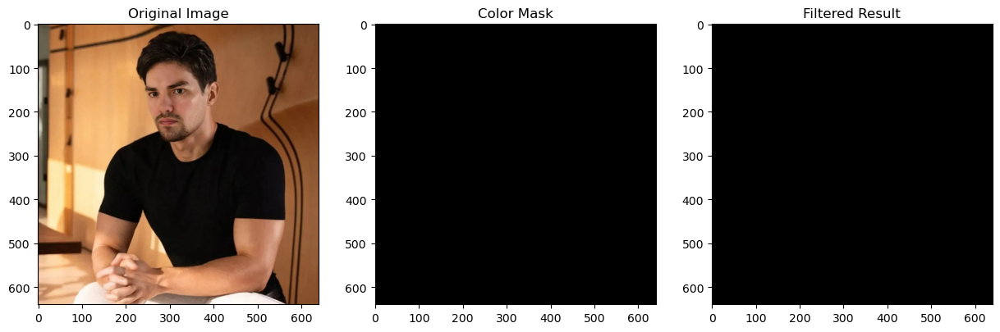

In [102]:
# Загрузка изображения
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Выбор цветового диапазона (пример для синего цвета)
lower_blue = np.array([90, 50, 50])   # Минимальные значения HSV
upper_blue = np.array([130, 255, 255]) # Максимальные значения HSV

# Создание маски
mask = cv2.inRange(hsv, lower_blue, upper_blue)

# Применение маски к изображению
result = cv2.bitwise_and(img_rgb, img_rgb, mask=mask)

# Визуализация
plt.figure(figsize=(15, 5))
plt.subplot(131), plt.imshow(img_rgb), plt.title('Original Image')
plt.subplot(132), plt.imshow(mask, cmap='gray'), plt.title('Color Mask')
plt.subplot(133), plt.imshow(result), plt.title('Filtered Result')
plt.show()

<h3> Другие фильтры и методы фильтрации</h3>

1. Логические маски и битовые операции: с помощью масок и операций bitwise_and можно создавать сложные фильтры, выделяющие определённые области изображения по цвету или другим признакам.

2. Фильтрация ключевых точек и геометрическая фильтрация: OpenCV содержит функции для фильтрации соответствий и ключевых точек на основе геометрических преобразований, например, с помощью RANSAC, что помогает отсеять ложные совпадения.